In this notebook, the observed data are processed **for inversion**. If they are field data, processing consists of filtering and muting, if synthetic data - only of muting.

#### Notebook config

In [1]:
# %load ~/software/fullwavepy/fullwavepy/config/jupyter.py 
from fullwavepy import * # Load modules imported in fullwavepy/__init__.py
# -----------------------------------------------------------------------------
# Set aliases of frequently used jupyter magic commands
# -----------------------------------------------------------------------------
%alias_magic mi matplotlib -p inline
%alias_magic mn matplotlib -p notebook
# -----------------------------------------------------------------------------
# Set matplotlib backend
# -----------------------------------------------------------------------------
# non-interactive plots displayed in a notebook cell
%matplotlib inline
# interactive plots displayed in a notebook cell
# %matplotlib notebook (interactive version)
# -----------------------------------------------------------------------------
# Set matplotlib style
# ----------------------------------------------------------------------------
plt.style.reload_library()
# a combined style (right overwrites left wherever they overlap):
plt.style.use(['default', 'ggplot'])
# print(plt.style.available) 
# -----------------------------------------------------------------------------
# Configure logging
# -----------------------------------------------------------------------------
# Set up loggers, handlers and load the log_lvl function
from fullwavepy.config.logging import *
# -----------------------------------------------------------------------------
# Set level of log-messages
log_lvl(ERROR) 
# Other options in order of increasing importance and 
# decreasing verbosity:
# TRACE, DEBUG, INFO, WARNING, ERROR, CRITICAL
# or using integers: 0, 10, 20, 30, 40, 50, respectively
# -----------------------------------------------------------------------------
# Autocompleting
# -----------------------------------------------------------------------------
#  Not sure if it works
#%config IPCompleter.greedy=True 
# -----------------------------------------------------------------------------
# Automatically reload modules before execution
#%load_ext autoreload
#%autoreload 2

Created `%mi` as an alias for `%matplotlib inline`.
Created `%mn` as an alias for `%matplotlib notebook`.


In [2]:
from fullwavepy.seismic.data import Dat
path_eph = '/home/kmc3817/rds_home/my_ephemeral/PROJECTS/ch08_Kolumbo_volcano'
exe = { 
    'fullwave':  '~/PhD/fullwave3D/rev690/bin/fullwave3D.exe',
    'fullwave_local': '/home/kmc3817/light_PhD/fullwave3D/rev690/bin/fullwave3D.exe',
    'segyprep':  '/home/kmc3817/light_PhD/fullwave3D/segyprep_v3.16/bin/segyprep_v3.16'} 
xp = PROTEUS()
b01 = xp.box['kol1'].box
dis01 = {'dt': 0.0025, 'dx': 50, 'ns': 3000}
s01 = ProjSyn('method_s01', path = './', exe=exe, box=b01, **dis01, cat=0)

##### Test the `fullwavepy.seismic.data` package

In [61]:
!python3 -m unittest fullwavepy.seismic.test.test_data  -v

test_init (fullwavepy.seismic.test.test_data.TestDat) ... ok
test_interlace (fullwavepy.seismic.test.test_data.TestDat) ... ok
test_read (fullwavepy.seismic.test.test_data.TestDat) ... ok
test_data_muter_susgy (fullwavepy.seismic.test.test_data.TestDataMuter) ... ok
test_extract (fullwavepy.seismic.test.test_data.TestDataSet) ... ok
test_get_files (fullwavepy.seismic.test.test_data.TestDataSet) ... ok
test_get_files_within_extent (fullwavepy.seismic.test.test_data.TestDataSet) ... ok
test_get_stations_within_extent (fullwavepy.seismic.test.test_data.TestDataSet) ... ok

----------------------------------------------------------------------
Ran 8 tests in 0.041s

OK


# Init a project

In [3]:
p = ProjInv('data_inv', path='./', exe=exe, box=b01, **dis01, cat=0)

# Prerequisites

## Raw data

We first create a handle of the `0822..ipynb` data subset.

In [15]:
ds = DataSet(path='./data/dataset_obs_hy_box01/', regex='*00.sgy', io='proteus_hy')

Then we create a future reference for the preprocessor:

In [16]:
p.i.rse.prep(fnames=['../../%s' % i for i in ds.fnames])

Content of  .//data_inv//inp/data_inv-RawSeis.txt : 
../.././data/dataset_obs_hy_box01//MGL1521_S104_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S109_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S112_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S124_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S125_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S137_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S157_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S158_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S177_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_S178_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_W105_4_x8000_25000_y-3000_15000.sgy
../.././data/dataset_obs_hy_box01//MGL1521_W110_4_x8000_25000_y-3000_15000.sgy

Finally, let us plot one of the receiver gathers:

CPU times: user 260 ms, sys: 324 ms, total: 584 ms
Wall time: 1.86 s


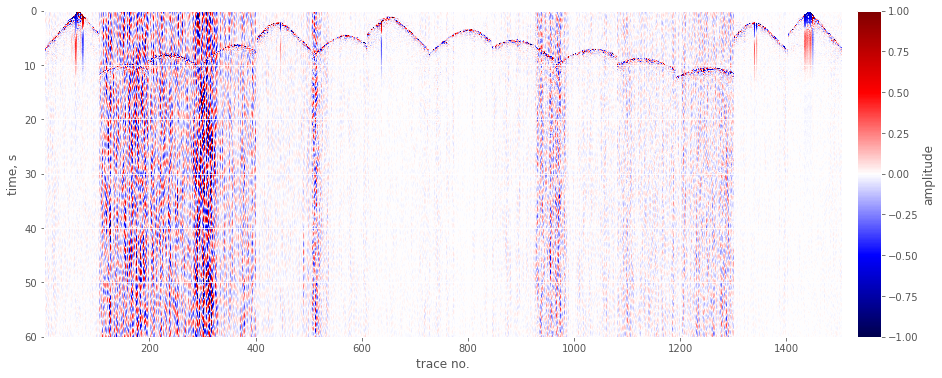

In [49]:
%%time 
dat = Dat(ds.id[104], dt=.005)
figure(15,6)
dat.plot(overwrite=0, overwrite_mmp=0)

## Others

To run the default `fullwave3d`'s preprocessor (see below), we need to first prepare also input other than data, it doesn't really matter for processing as long as the preprocessor doesn't raise a fatal error.

In [25]:
p.i.svp.dupl(s01.i.tvp.fname)
p.i.rsg.dupl(s01.i.rsg.fname)

# Preprocess

We have set the time-discretisation to $3000$ time samples, each $0.0025$ s long. Both numbers are different in the raw data, so the pre-processing will trim and resample the traces.

In [26]:
%%time 
p.i.sp.prep(reciprocity=True, ztype='d')
p.i.sp.run()
p.i.rnf.prep(b_abs=40, e_abs=50)

Content of  .//data_inv//inp/data_inv-SegyPrep.key : 
FFID : yes
addtodepth : 0
debug : yes
dtms : 2.5
dx : 50.0
fixedarray : yes
geometry : segy
io : sgy
maxoffset : 1000000.0
minoffset : 0
nx1 : 341
nx2 : 361
nx3 : 81
outseis : yes
outsource : yes
problem : tomography
reciprocity : True
retain : yes
text : yes
ttime : 7500.0
unique : yes
xorigin : 8000.0
xshift : 0
yorigin : -3000.0
yshift : 0
ztype : d
 

 SEGYPREP  -  Version 3.16.04                                                     
 ********

 Data preparation for 2D & 3D wavefield tomography

 Project name set to data_inv
 Preparing files for inversion...

 Grid points in-line:                    341
 Grid points cross-line:                 361
 Grid points vertically:                  81
 Horiz grid spacing (metres):      50.0000000    
 Vert grid spacing (metres):       50.0000000    
 Model length (metres):            17000.0000    
 Model width (metres):             18000.0000    
 Model depth (metres):             4000.00

# Process data

#### Alg.
First, create a backup of the raw data, because processing ovewrites the preproprocessed `p.i.obs` data created by the preprocessor with the processed data. Do it only once per preprocessing (after preprocessing and before processing)

In [29]:
# p.i.obs.raw.dupl(p.i.obs.fname) # do only once, otherwise it'll be overwritten by filtered

## Filter

#### Alg.
Filter the raw, preprocessed data (the previous version of `p.inp.obs` will be overwritten).

In [51]:
%%time 
kw_filt = {'pad': 100, 'f1': 2, 'f2': 3, 'f3': 4.5, 'f4': 6.5, 'zerophase': False}
p.i.obs.dupl(p.i.obs.raw.fname)
p.i.obs.filt(dt=0.0025,  **kw_filt)

CPU times: user 52 ms, sys: 128 ms, total: 180 ms
Wall time: 33.6 s


#### Fig.
Raw and filtered data interlaced. Note that on the normalised plots the noise has been enhanced for the shorter traces (strong water waves excluded).

In [20]:
%%time 
station = 4104
raw = Dat(file=p.i.obs.raw, dt=.0025)
fil = Dat(file=p.i.obs.fil, dt=.0025)

CPU times: user 0 ns, sys: 0 ns, total: 0 ns
Wall time: 27.4 µs


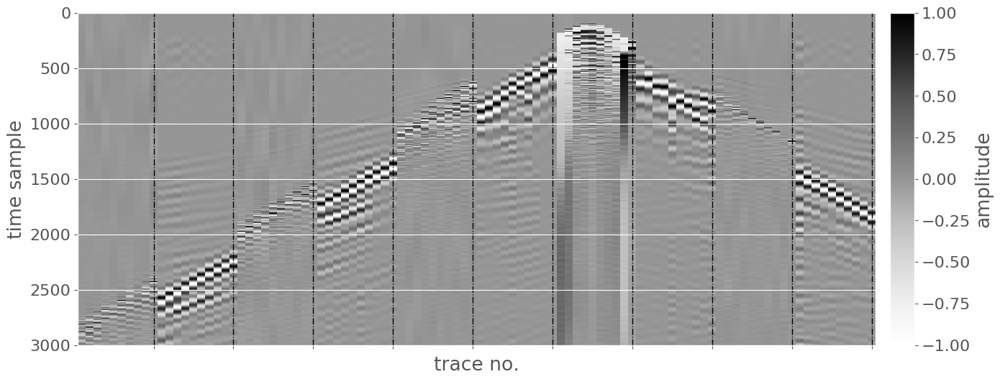

In [82]:
# plot 
figure(15,6)
station = 4104
kws = dict(station=station, overwrite=0, overwrite_mmp=0)
chunk_size = 10
ic = raw.interlace(fil, chunk_size=chunk_size, **kws)
ic.plot(cmap='Greys') # it doesn't keep track of lines, as it's just array...
plt.ylabel('time sample') # FIXME
ti = np.arange(len(ic.arr.arr))[::chunk_size] - .5     
ax = plt.gca()
# ax.set_title('aldfj')
ax.set_xticks(ti)
ax.grid(axis='x', c='k', linestyle='-.', linewidth=1)  
empty_string_labels = ['']*len(ti)
_ = ax.set_xticklabels(empty_string_labels)
_= plt.xlim(0,100)

#### Fig.
Raw (top) vs. filtered (bottom) data. 

In [16]:
raw = Dat(file=p.i.obs.raw, dt=.0025)
fil = Dat(file=p.i.obs, dt=.0025)
kws = dict(station=4104, overwrite=0, overwrite_mmp=0)

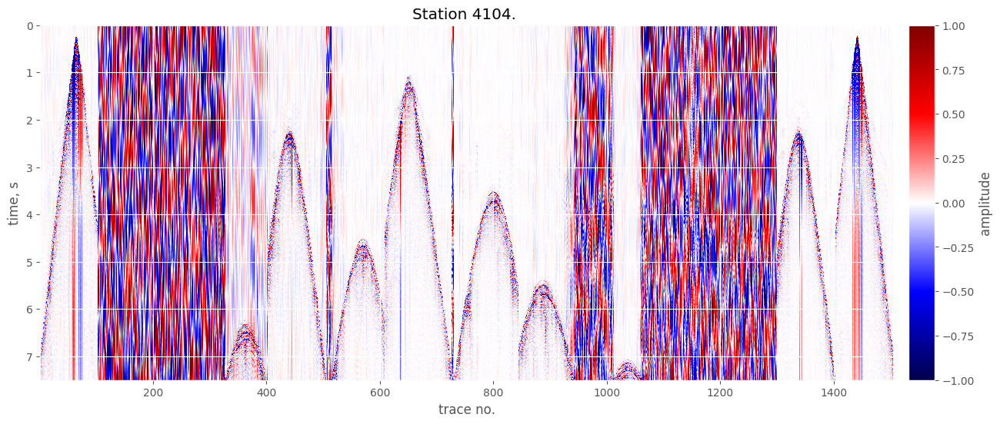

In [23]:
figure(15,6)
raw.plot(**kws)

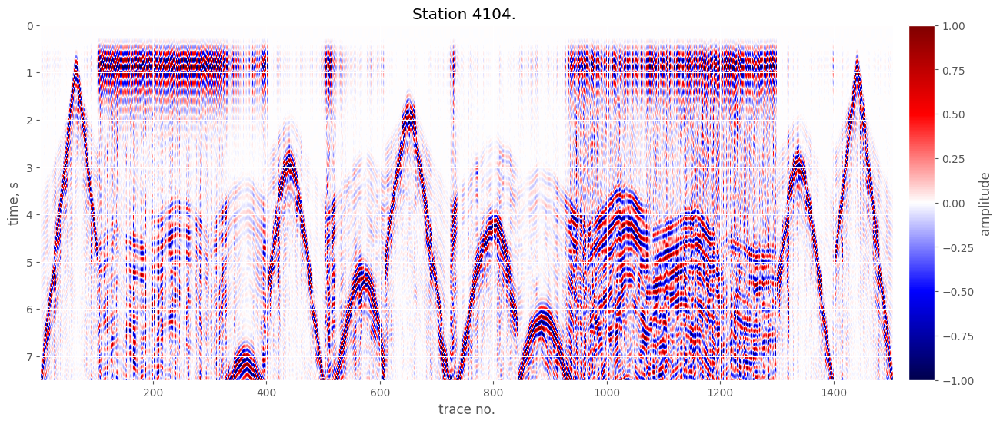

In [24]:
figure(15,6)
fil.plot(**kws)

## Get first breaks

#### Alg.
Extract first breaks from synthetics. Note that they are **in samples**, not seconds. It takes about 2 minutes for this dataset. If already done, see the alternative below.

In [18]:
%%time 
fbreaks = s01.o.syn.get_fbreaks()

CPU times: user 1min 52s, sys: 2.55 s, total: 1min 54s
Wall time: 2min


#### Alg.
Alternatively, read the first breaks from the text file. 

In [17]:
%%time 
from fullwavepy.ioapi.generic import read_txt
fbreaks = read_txt('data_s01/out/data_s01-Synthetic_firstbreaks.txt')
fbreaks = [float(i[0]) for i in fbreaks]

CPU times: user 16 ms, sys: 4 ms, total: 20 ms
Wall time: 21.7 ms


In [20]:
!ls 'data_s01/out/data_s01-Synthetic_firstbreaks.txt'

data_s01/out/data_s01-Synthetic_firstbreaks.txt


#### Alg.
Convert first breaks to seconds and merge them with the header metadata.

In [18]:
import pandas as pd
dt = .0025
df = pd.read_csv('data_s01/out/data_s01-Synthetic_HEAD.csv')
df['fb'] = [int(i) * dt for i in fbreaks]

#### Fig.
Filtered data with the first breaks overlain.

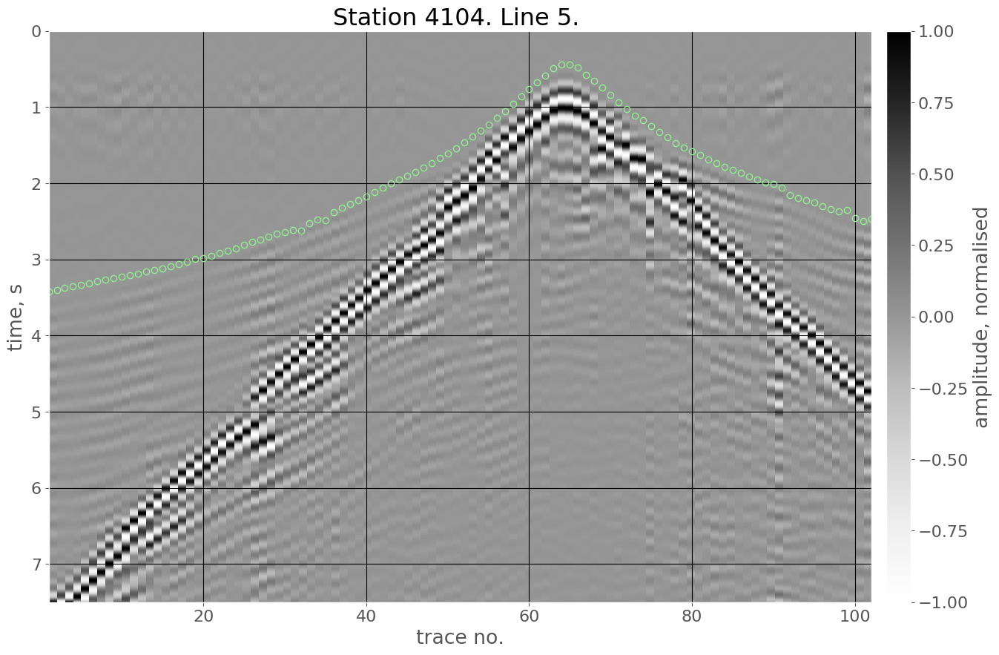

In [27]:
# plot 
import matplotlib as mpl
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.size'] = 16
figure(15,10)
station = 4104
line = 5
fil.plot(station=station, line=line, cmap='Greys', label='amplitude, normalised')
y = df.loc[(df.tracf==station) & (df.ep==line)]['fb']
x = range(1, len(y)+1)
plt.grid(color='k')
_ = plt.plot(x, y, 'o', markeredgecolor='lightgreen', markerfacecolor='none')

#### Fig.
Same as above but for all stations (shot-line 5).

CPU times: user 692 ms, sys: 324 ms, total: 1.02 s
Wall time: 16.3 s


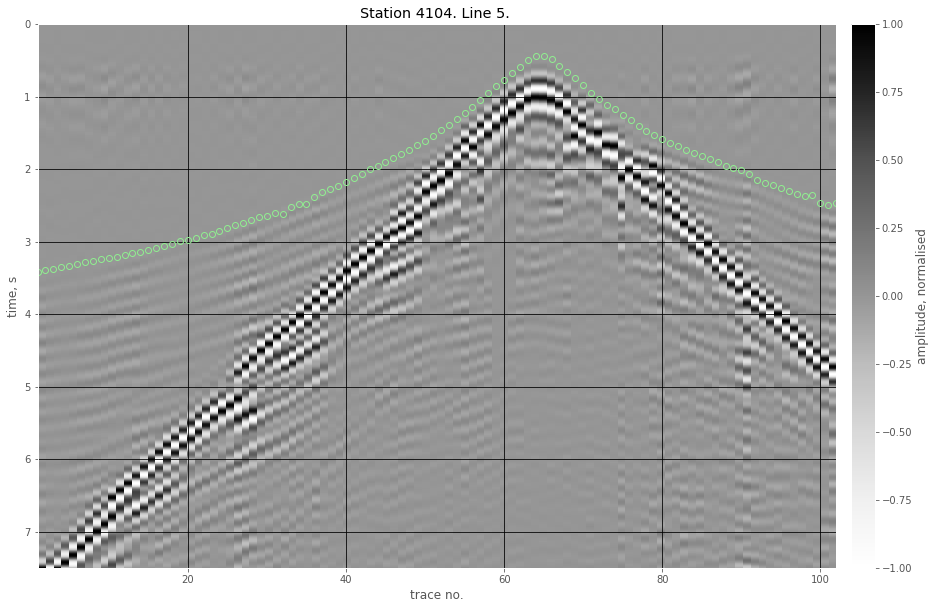

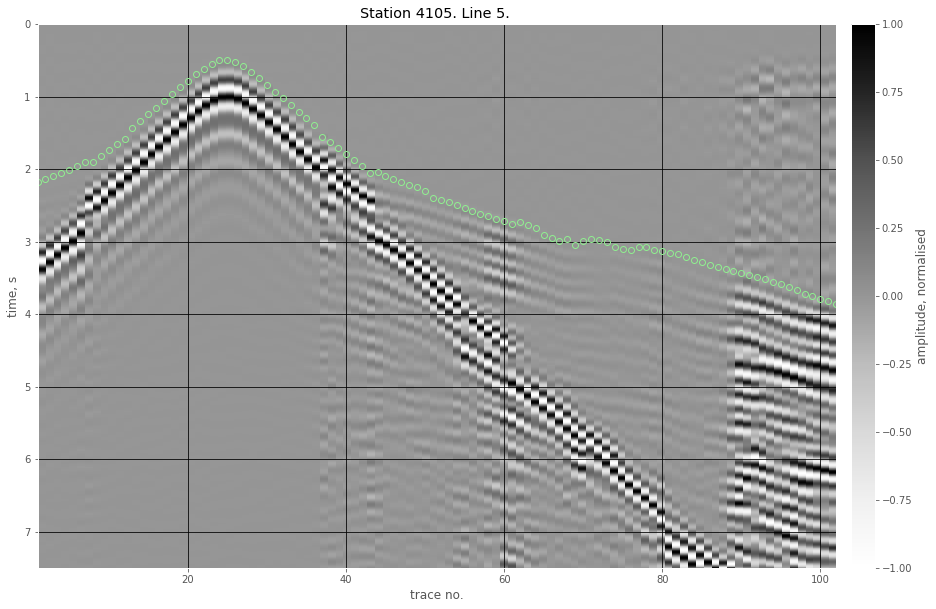

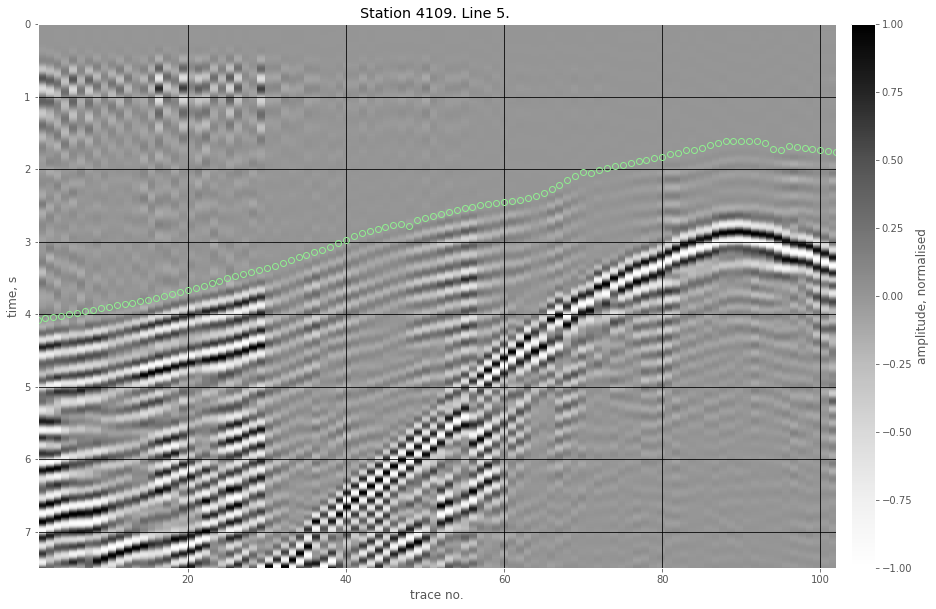

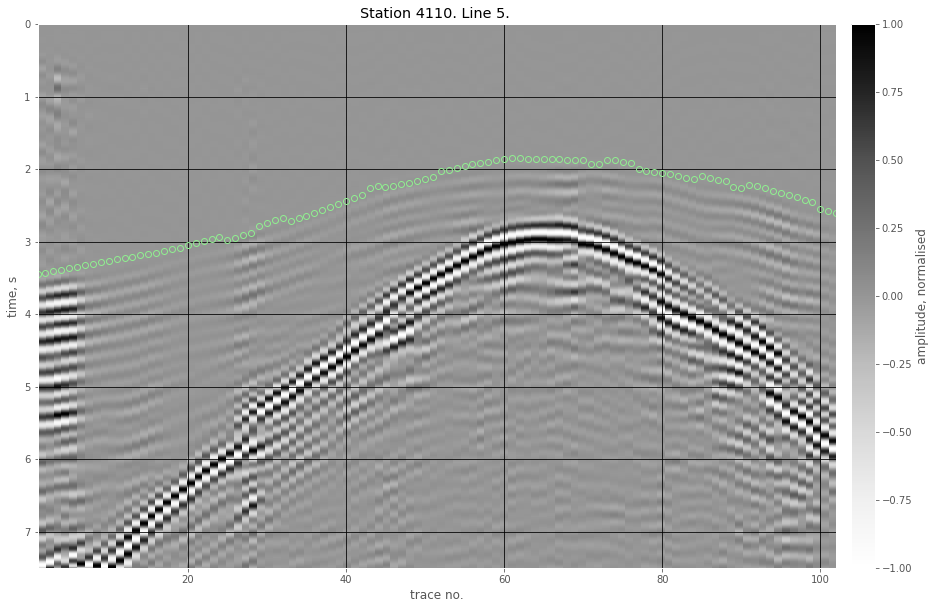

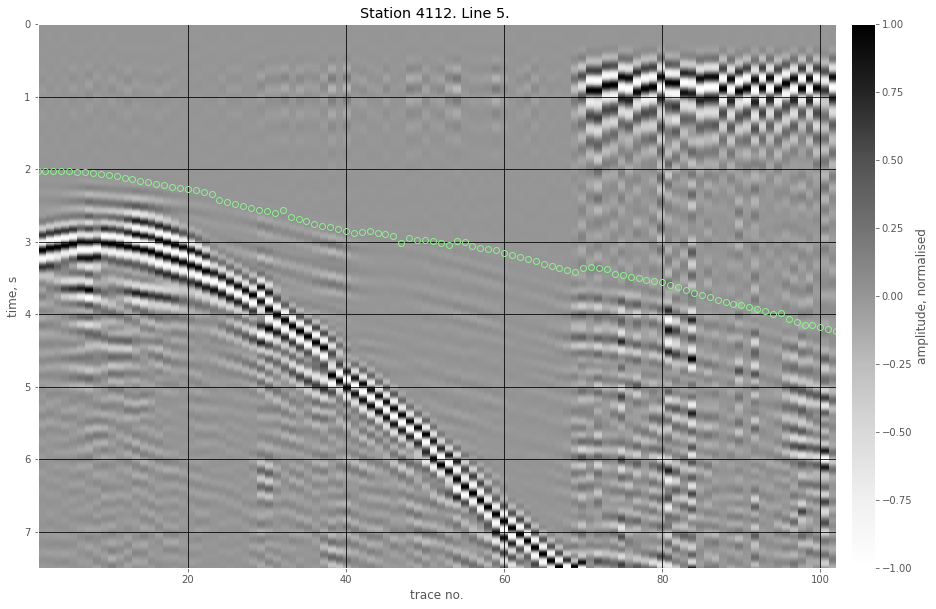

...

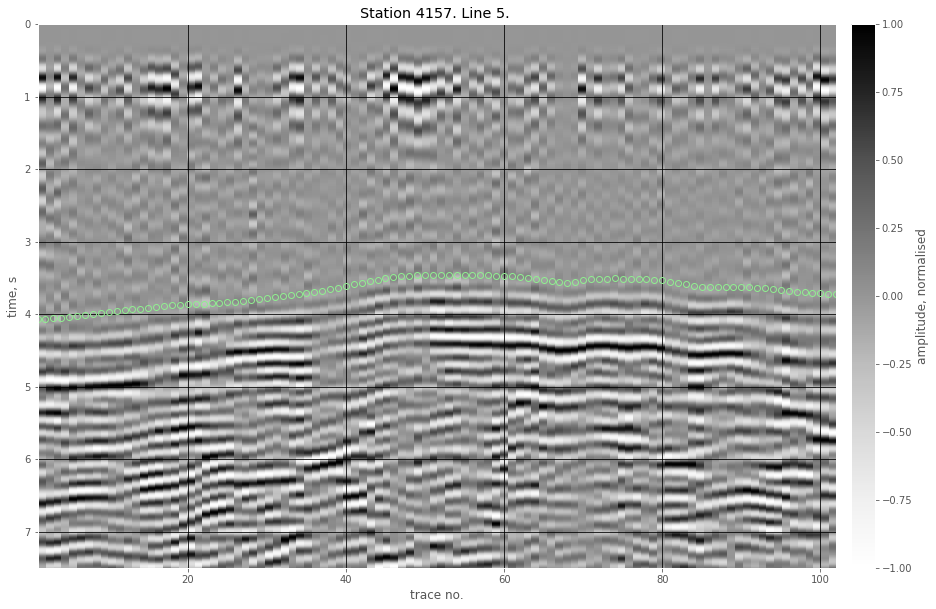

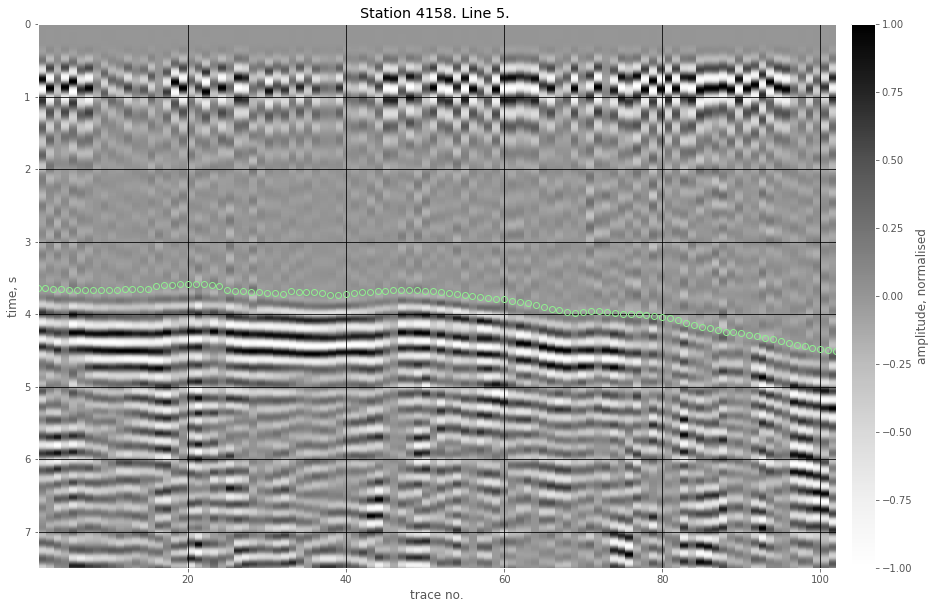

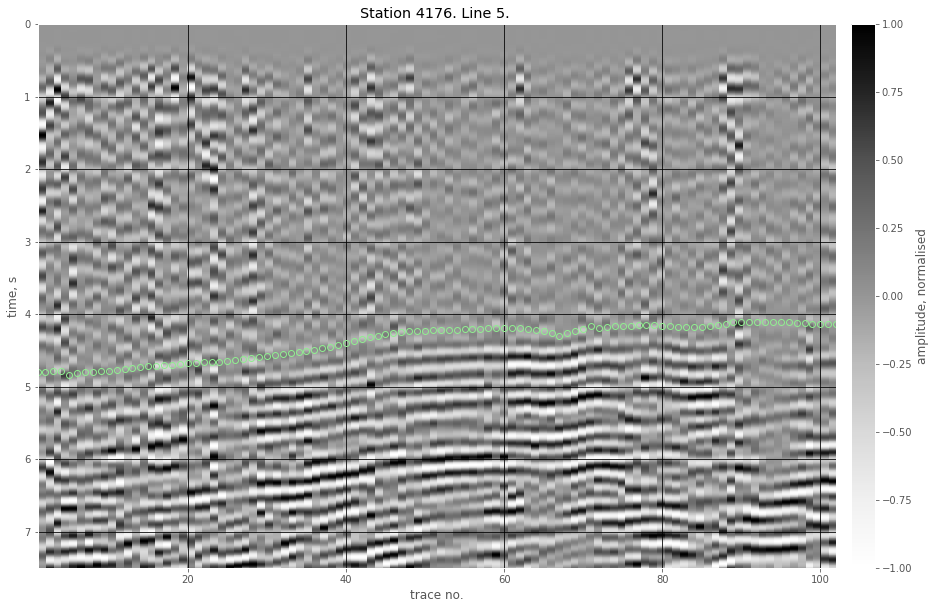

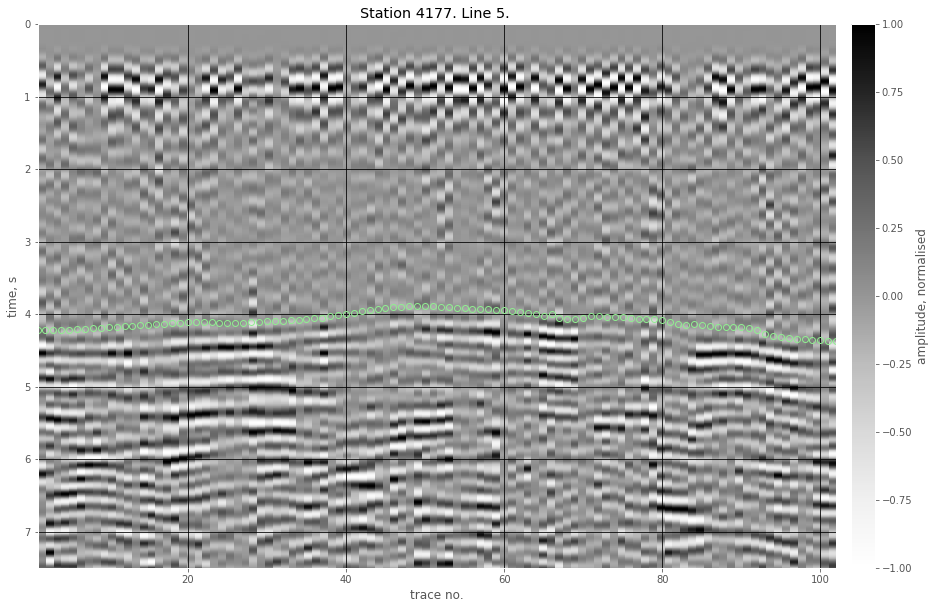

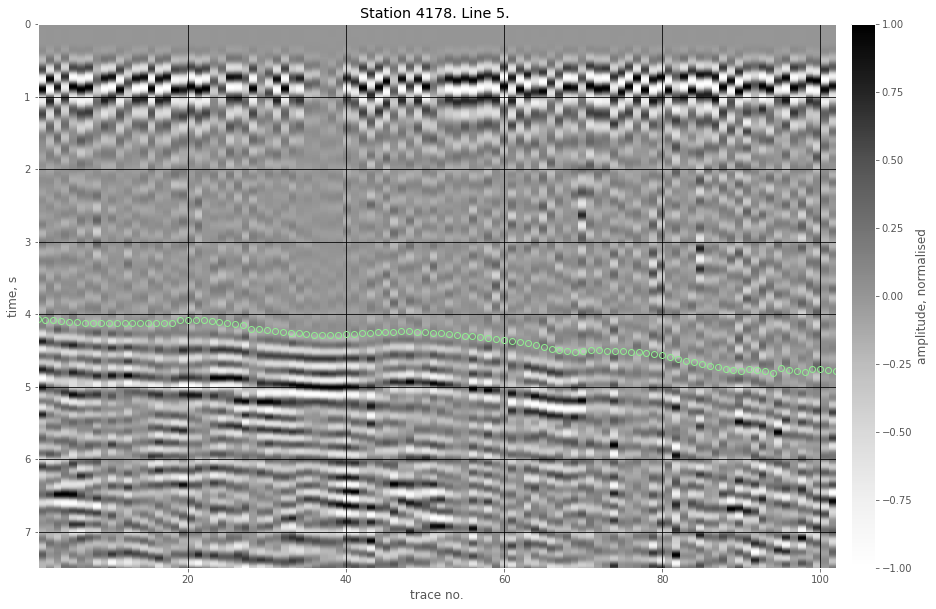

In [21]:
%%time 
stations = sorted(df.tracf.unique())
lines = sorted(df.ep.unique())
for station in stations:
    for line in lines:
        figure(15,10)
        fil.plot(station=station, line=line, cmap='Greys', label='amplitude, normalised')
        y = df.loc[(df.tracf==station) & (df.ep==line)]['fb']
        x = range(1, len(y)+1)
        plt.grid(color='k')
        _ = plt.plot(x, y, 'o', markeredgecolor='lightgreen', markerfacecolor='none')   
        break

CPU times: user 772 ms, sys: 484 ms, total: 1.26 s
Wall time: 17.1 s


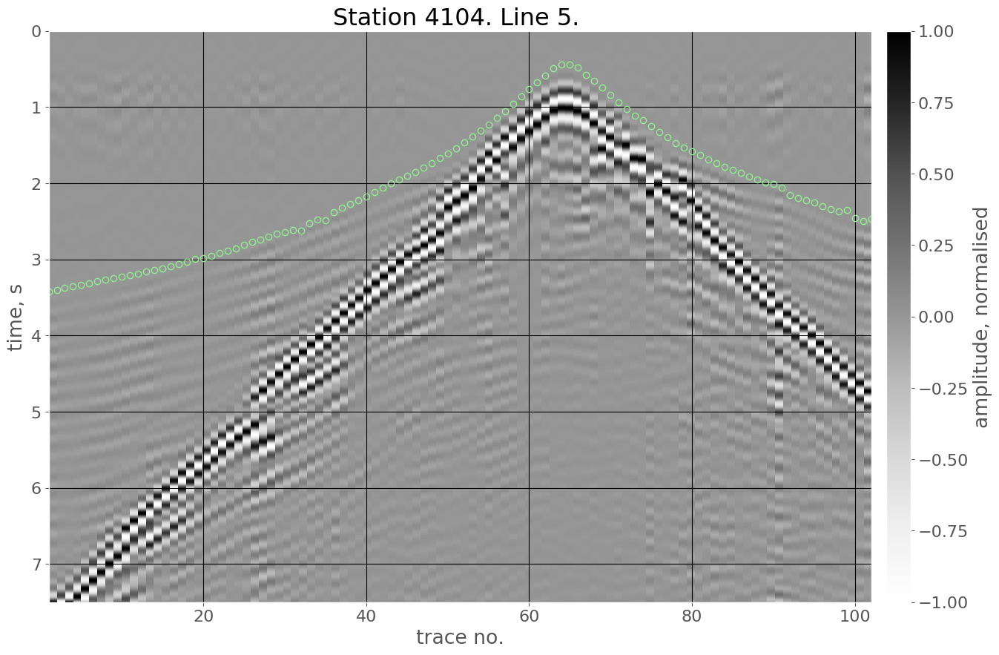

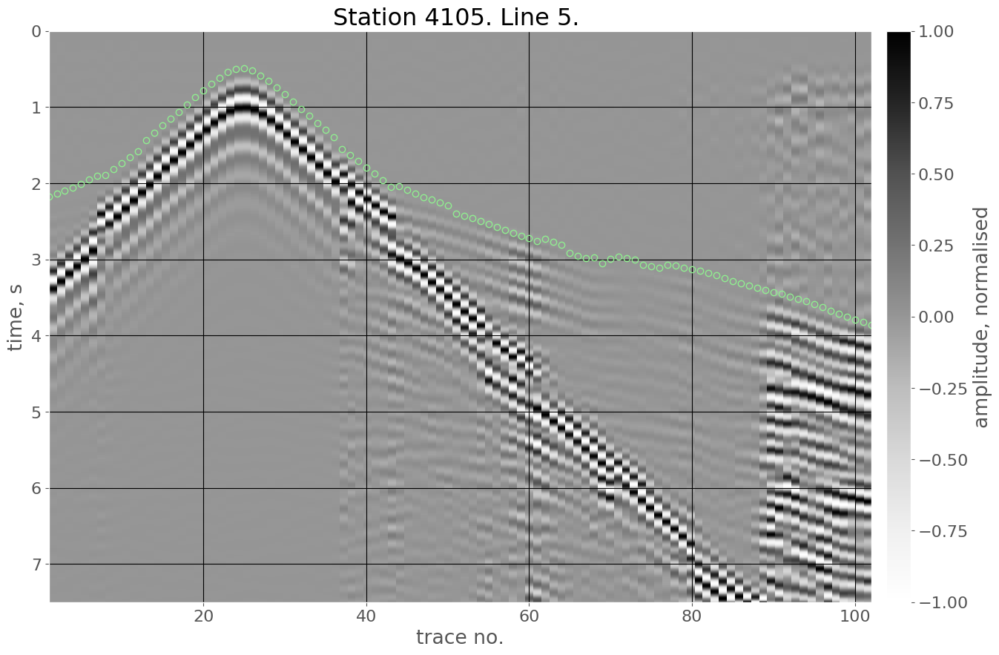

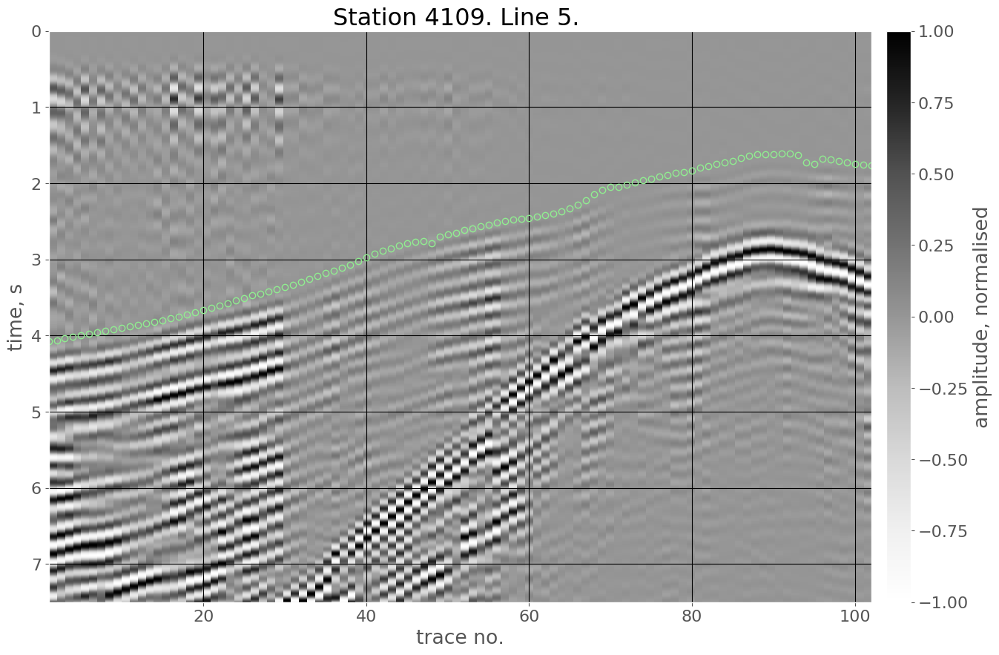

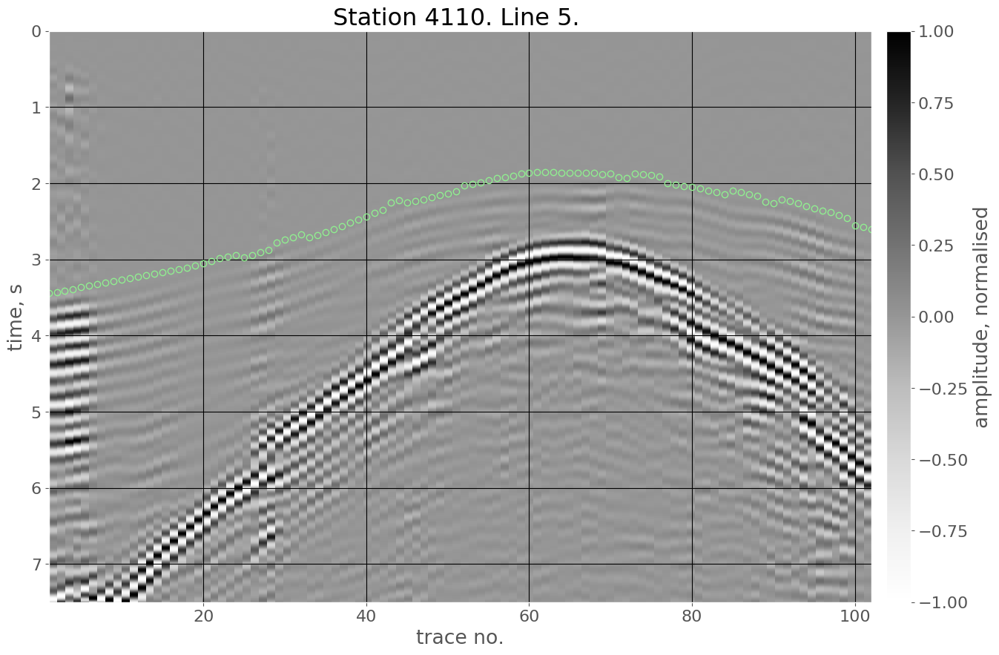

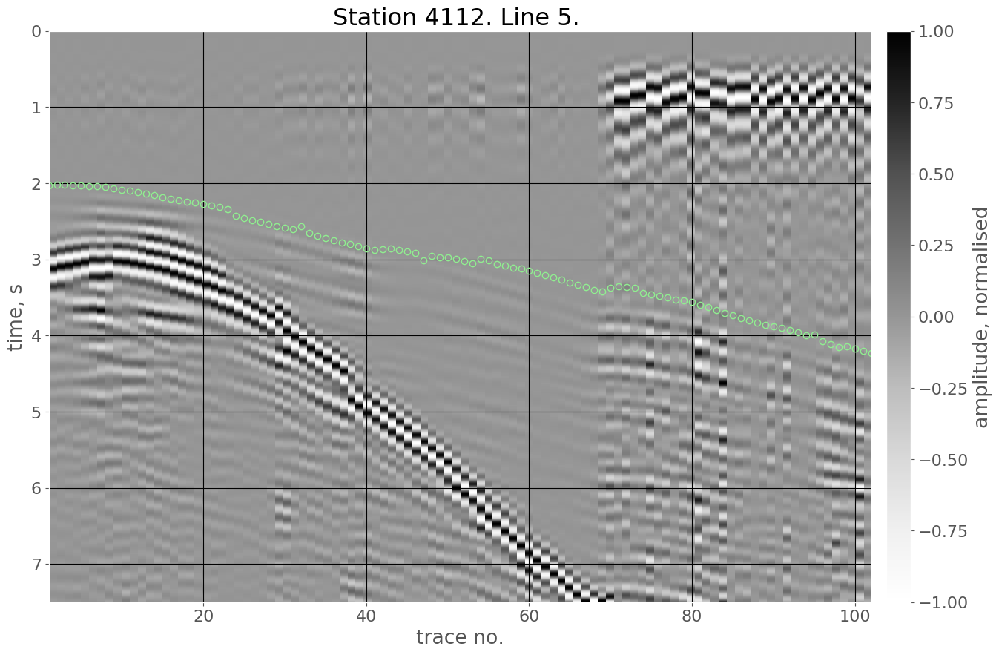

...

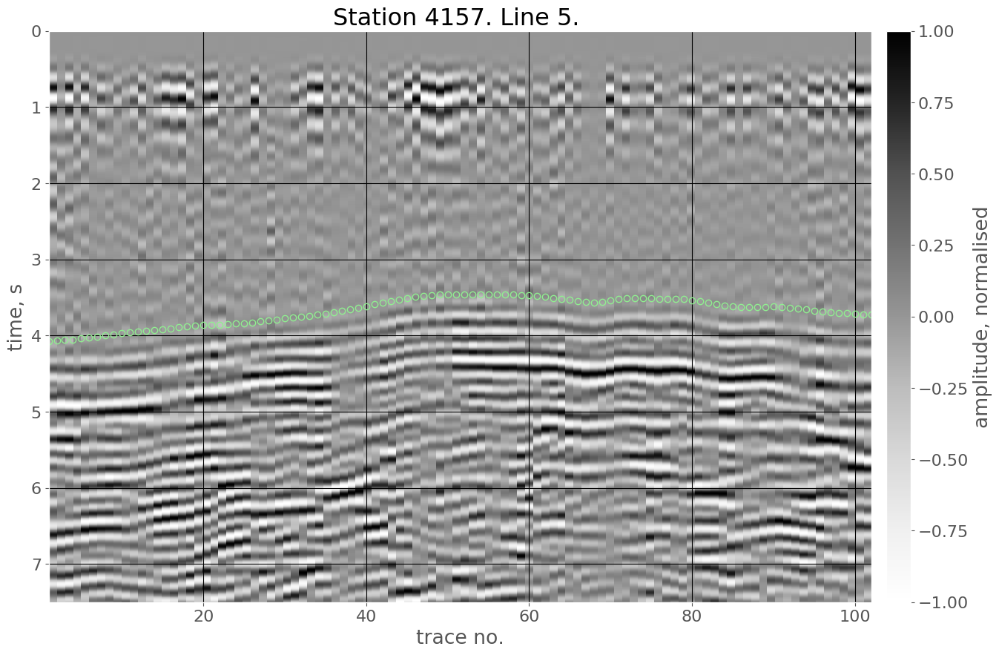

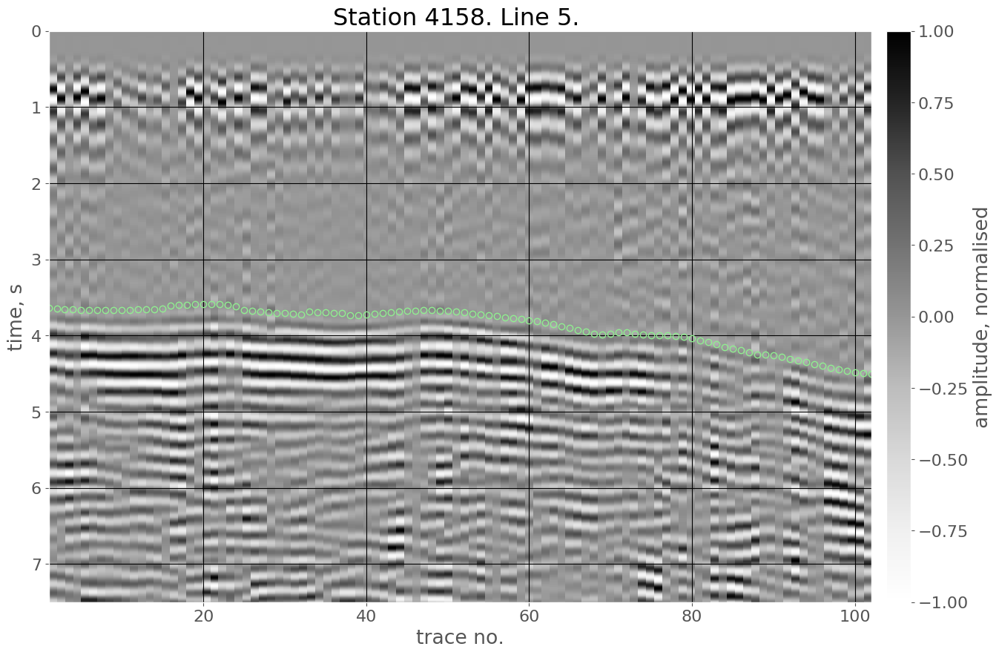

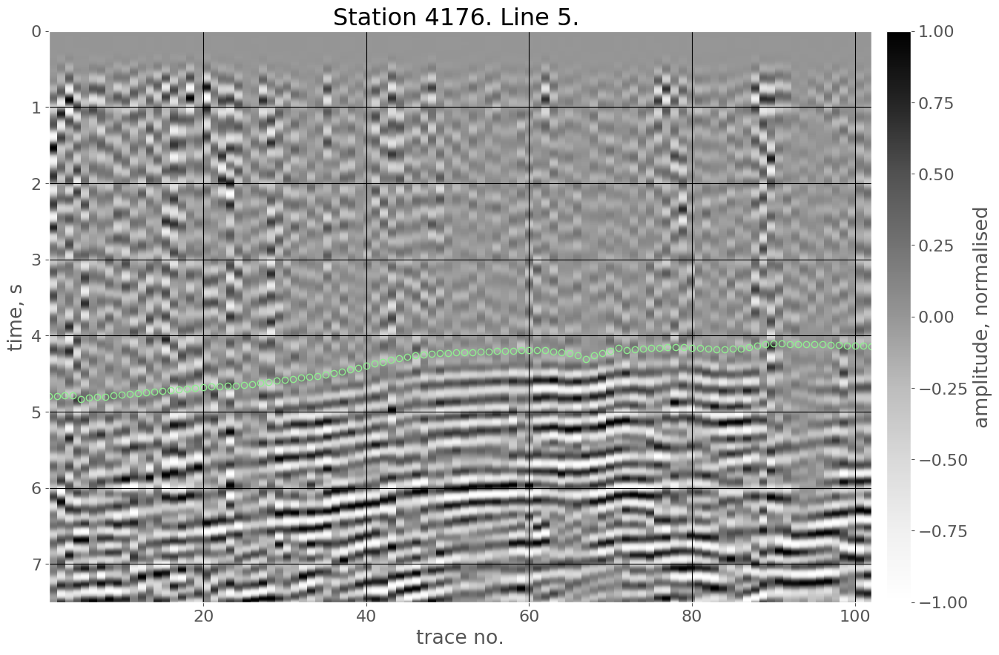

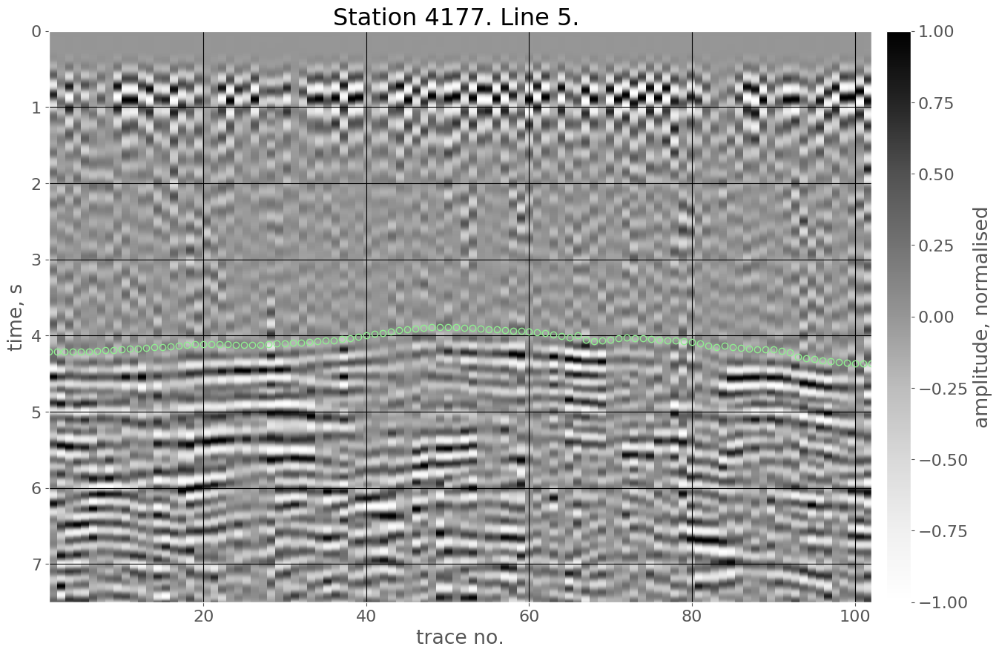

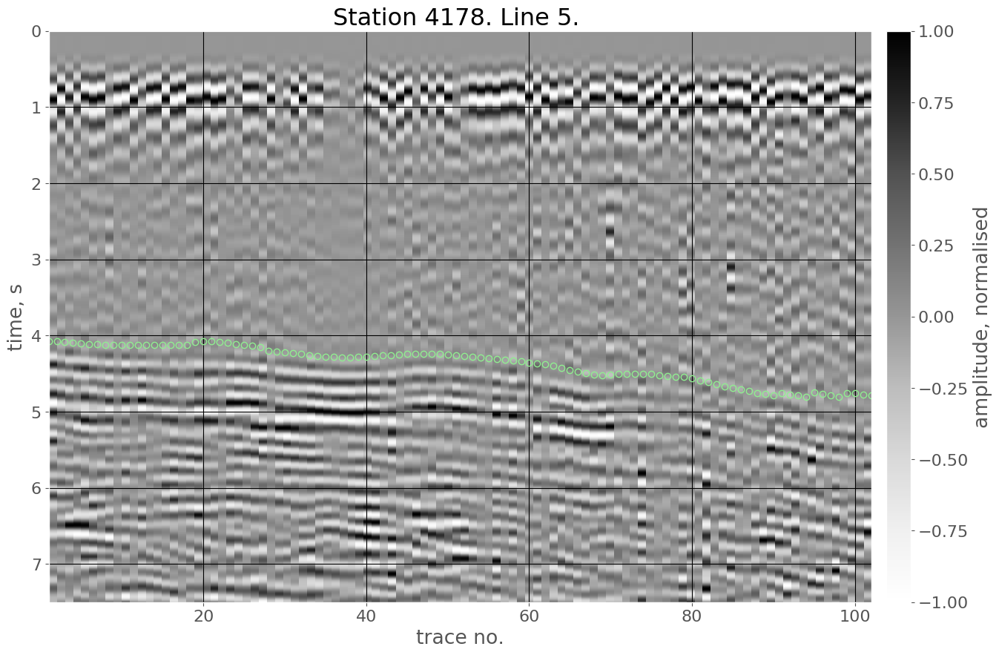

In [154]:
%%time 
stations = sorted(df.tracf.unique())
lines = sorted(df.ep.unique())
for station in stations:
    for line in lines:
        figure(15,10)
        fil.plot(station=station, line=line, cmap='Greys', label='amplitude, normalised')
        y = df.loc[(df.tracf==station) & (df.ep==line)]['fb']
        x = range(1, len(y)+1)
        plt.grid(color='k')
        _ = plt.plot(x, y, 'o', markeredgecolor='lightgreen', markerfacecolor='none')   
        break

## Mute

#### Alg.
Mute

In [23]:
%%time
from fullwavepy.seismic.data import DataMuterSUSGY, DataFileSgy
p.i.obs.dupl(p.i.obs.fil.fname)
lll(40)
DataMuterSUSGY().mute(p.i.obs.fname, tmute=df['fb'], twin=1.5)
lll(40)
mut = Dat(dt=.0025, file=DataFileSgy('data_inv-Observed_muted.sgy', 'data_inv/inp/'))

CPU times: user 32 ms, sys: 36 ms, total: 68 ms
Wall time: 4.54 s


#### Fig.
Muted data for all stations (shot-line 5).

CPU times: user 564 ms, sys: 320 ms, total: 884 ms
Wall time: 16.4 s


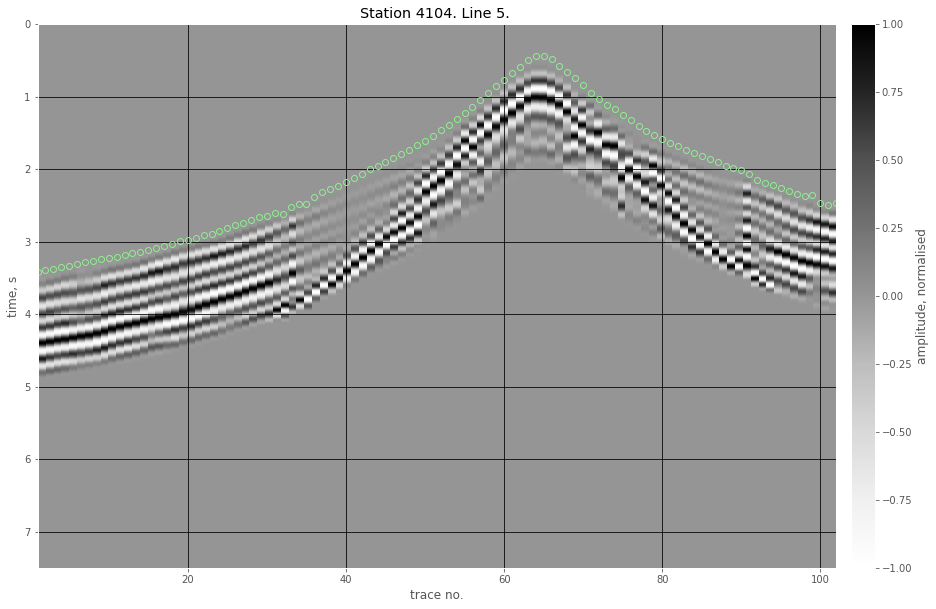

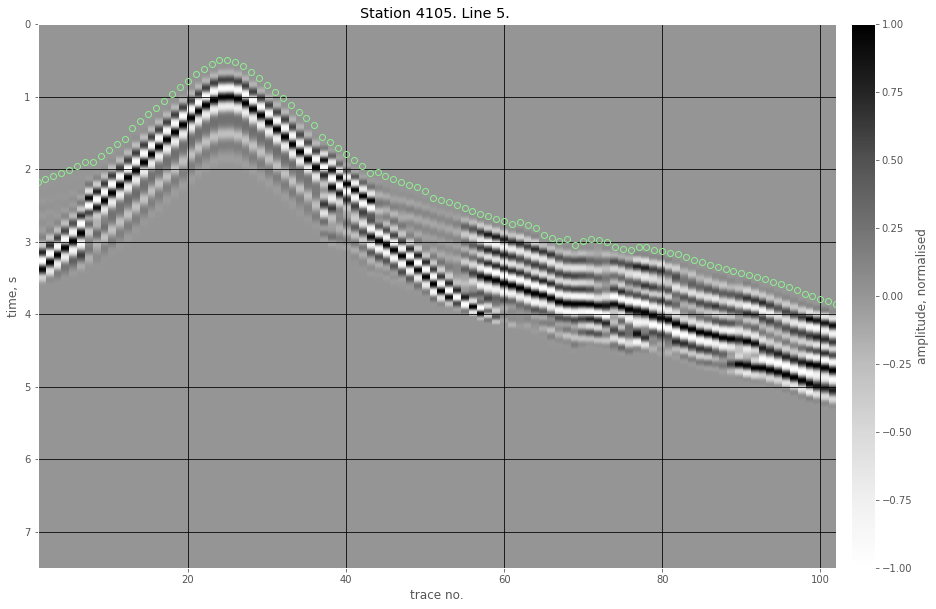

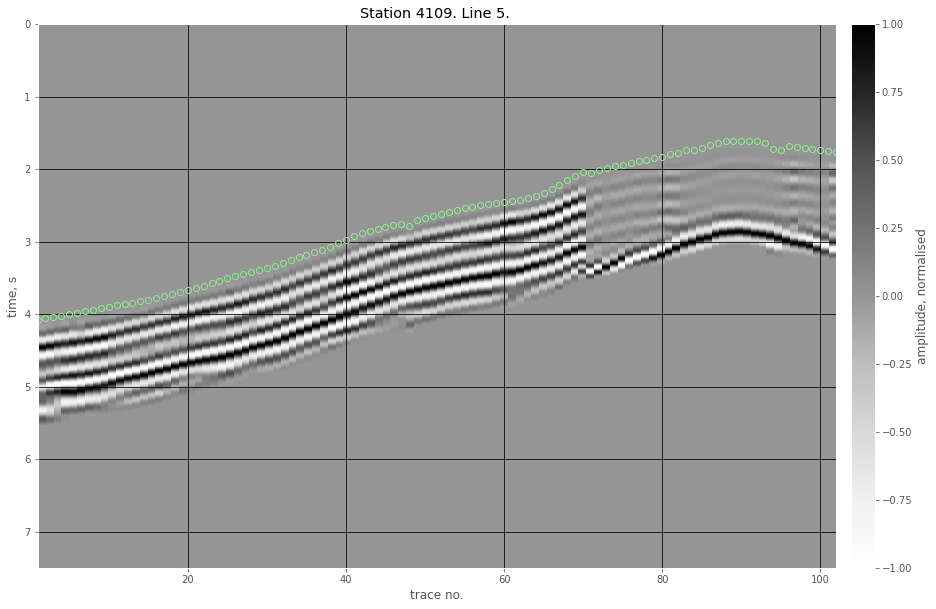

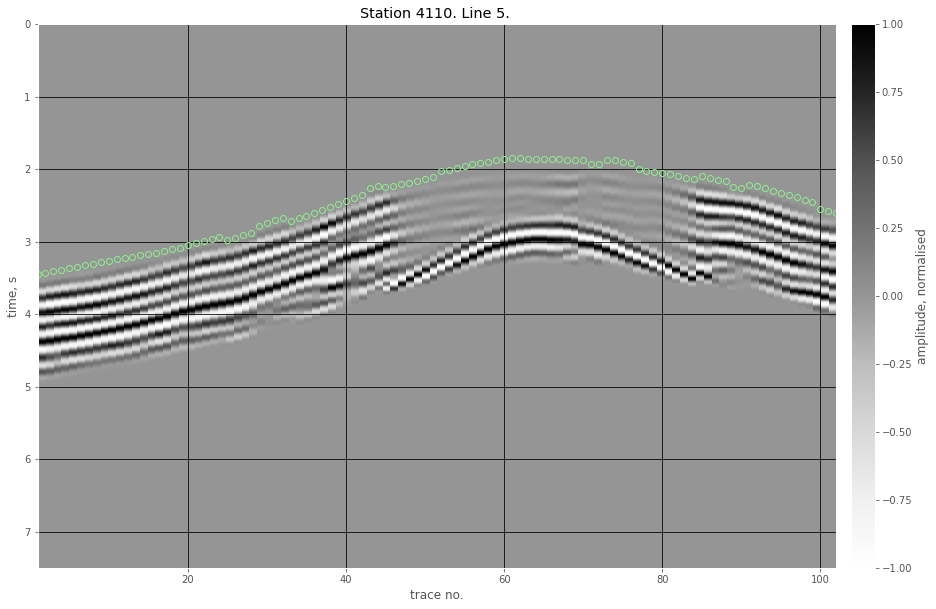

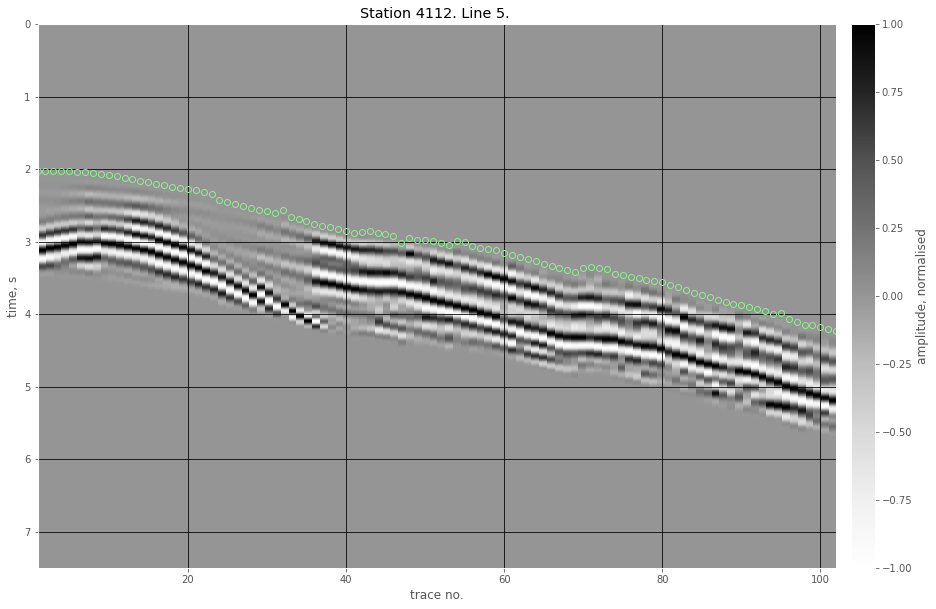

...

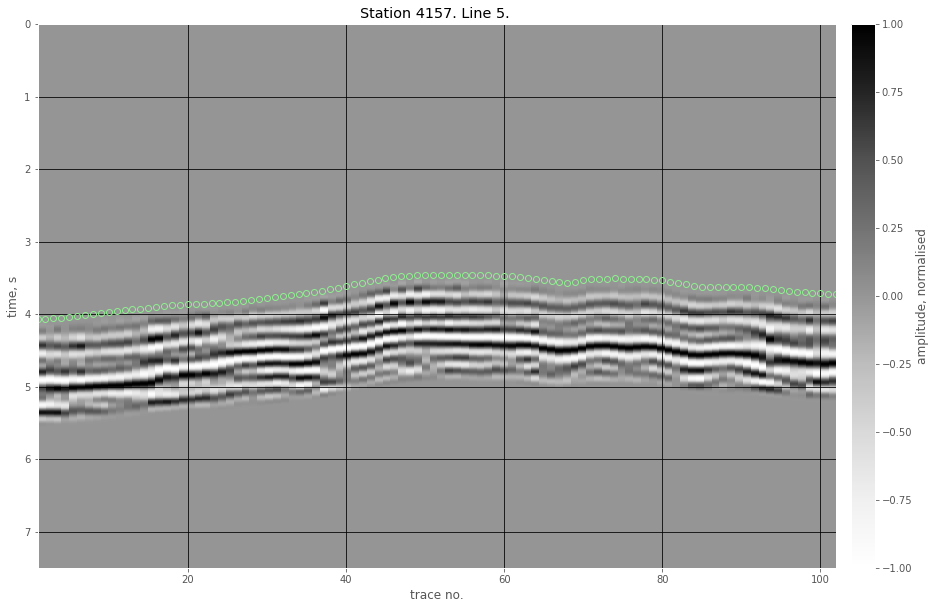

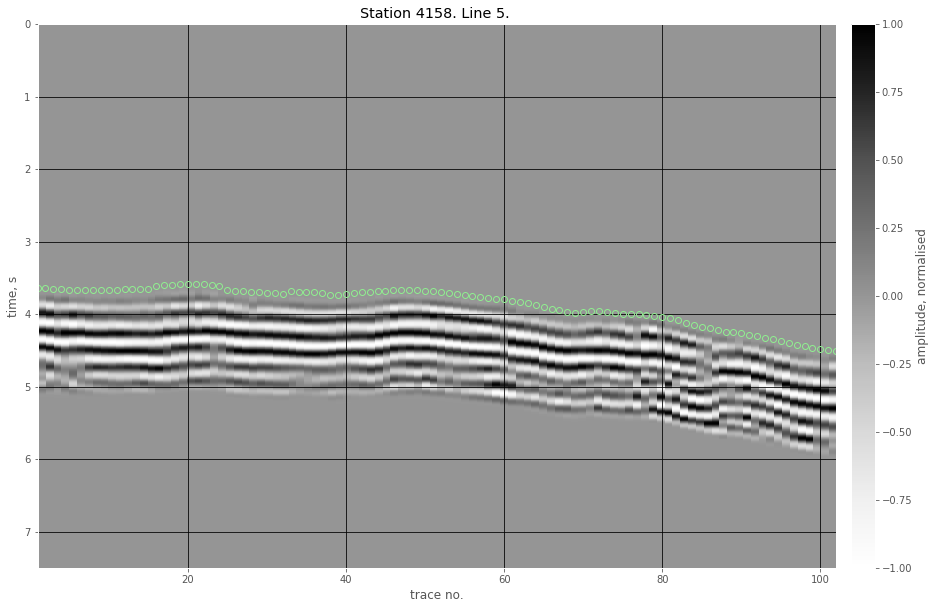

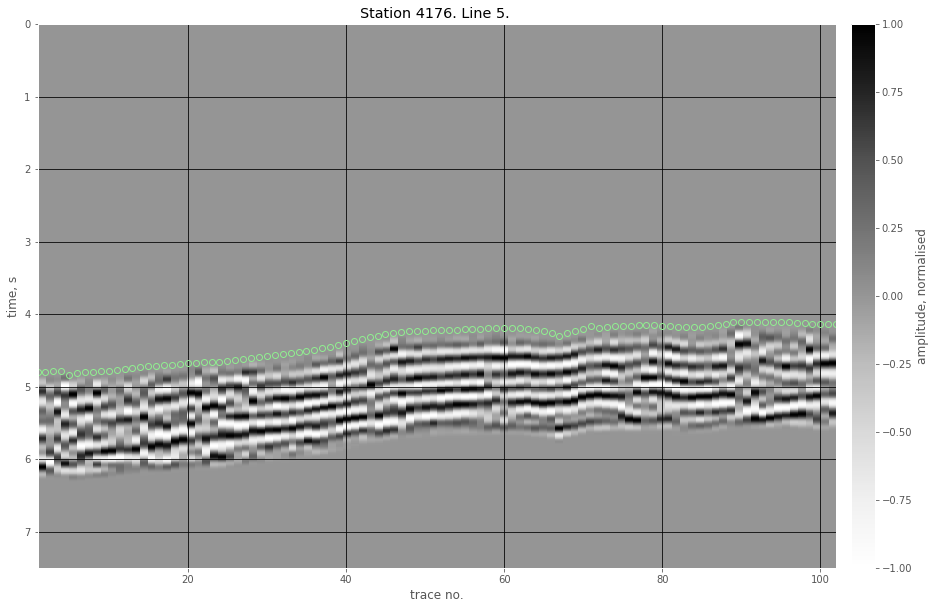

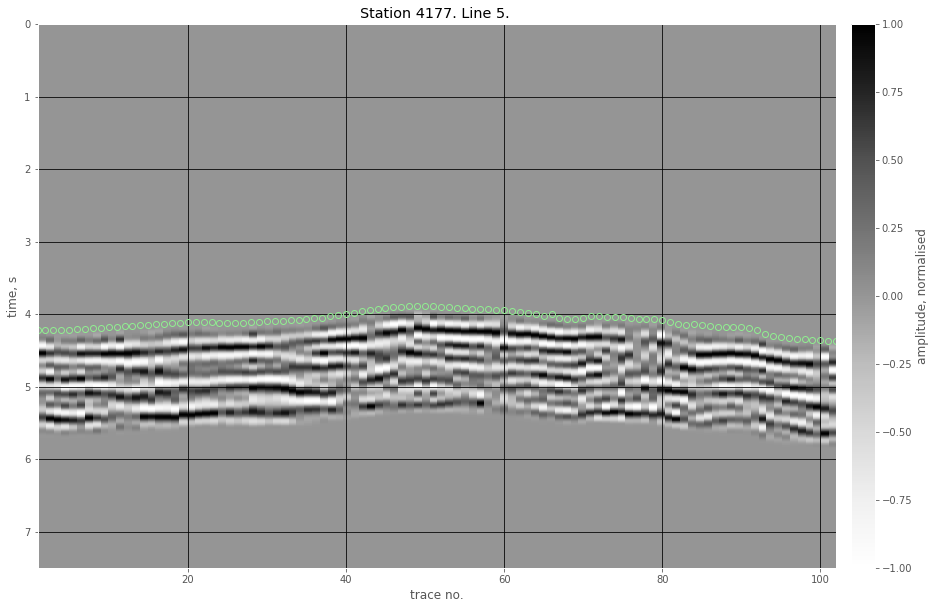

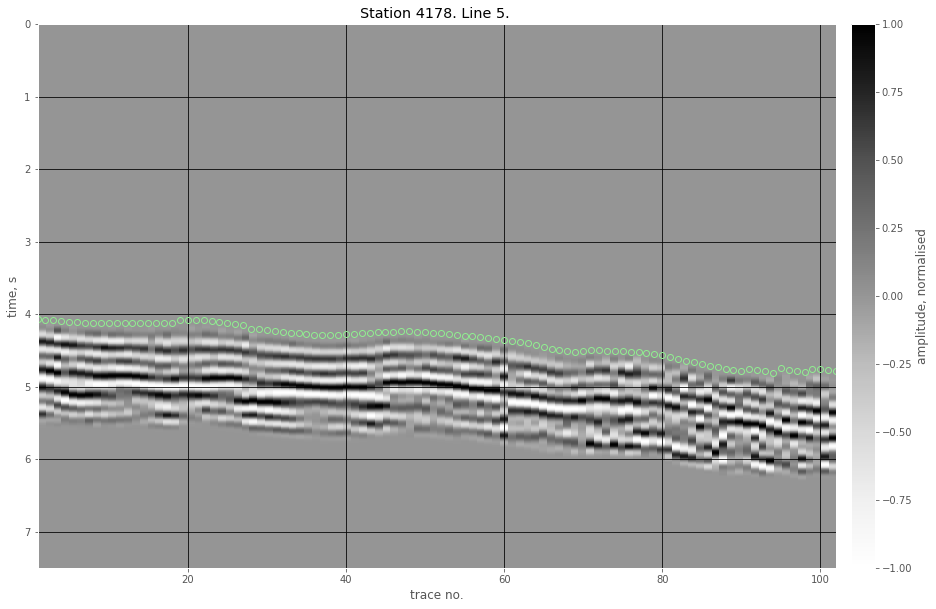

In [24]:
%%time 
lll(40)
stations = sorted(df.tracf.unique())
lines = sorted(df.ep.unique())
ov = 1
for station in stations:
    for line in lines:
        figure(15,10)
        mut.plot(station=station, line=line, cmap='Greys', label='amplitude, normalised',
                 overwrite=ov, overwrite_mmp=ov)
        y = df.loc[(df.tracf==station) & (df.ep==line)]['fb']
        x = range(1, len(y)+1)
        plt.grid(color='k')
        _ = plt.plot(x, y, 'o', markeredgecolor='lightgreen', markerfacecolor='none')   
        break

# Process synthetics

## Caveats

Filtering the observed data puts a 250 ms of static in the SEGY header which synthetic data lack - they have static of only 17 ms, like the raw observed data. Apparently the presence of this 250 ms static ensures the observed data are muted correctly. There are two potential methods to work around this:
* filtering the synthetics - but this shifts them even more towards later time and the muting effectively results in a shorter time window
* changing the static of the synthetics - **this works**, but the value of 250 ms should not be hardwired in case we change the filtering parameters (this will likely change the necessary static)

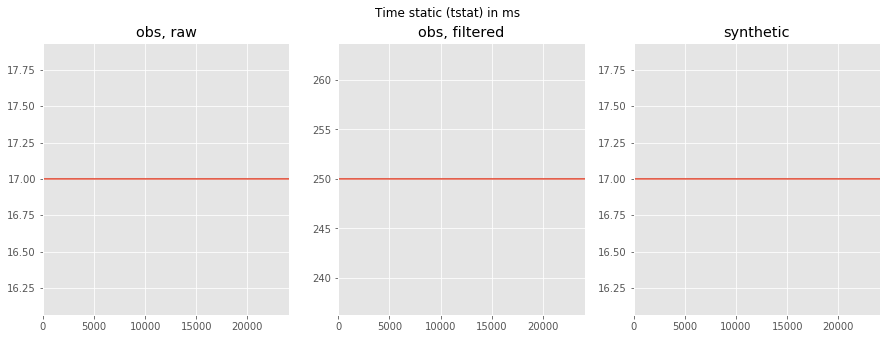

In [90]:
# plot 
ov = 0
figure(15,5)
plt.suptitle('Time static (tstat) in ms')
plt.subplot(131)
plt.title('obs, raw')
p.i.obs.raw.read_header(overwrite=ov).tstat.plot()
plt.subplot(132)
plt.title('obs, filtered')
p.i.obs.fil.read_header(overwrite=ov).tstat.plot()
plt.subplot(133)
plt.title('synthetic')
_ = s01.o.syn.read_header(overwrite=ov).tstat.plot()

## Workflow

#### Alg.
Mute synthetic data.

In [94]:
%%time 
path = './data/'
!cp {s01.o.syn.fname} {path}
syn = Dat(dt=.0025, file=DataFileSgy(s01.o.syn.name, path))
from fullwavepy.seismic.data import DataMuterSUSGY, DataFileSgy
tstat = p.i.obs.fil.read_header(overwrite=ov).tstat.unique()
assert len(tstat) == 1
tstat[0]
sushw(syn.file.fname, 'tstat', tstat)
DataMuterSUSGY().mute(syn.file.fname, tmute=df['fb'], twin=1.5)
synmut = Dat(dt=.0025, file=DataFileSgy('method_s01-Synthetic_muted.sgy', './data/'))

#### Fig.
Muted data for all stations (shot-line 5).

CPU times: user 708 ms, sys: 464 ms, total: 1.17 s
Wall time: 17.7 s


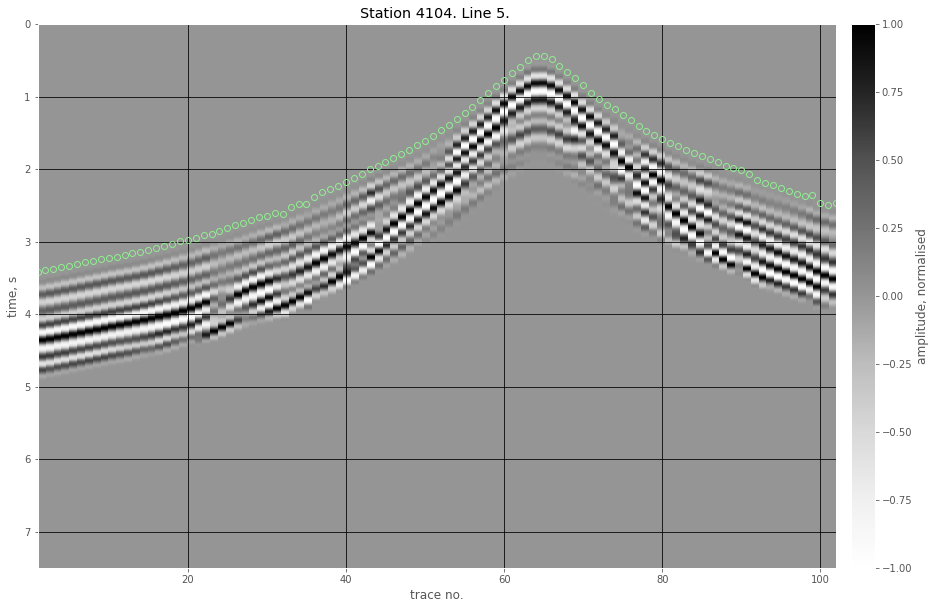

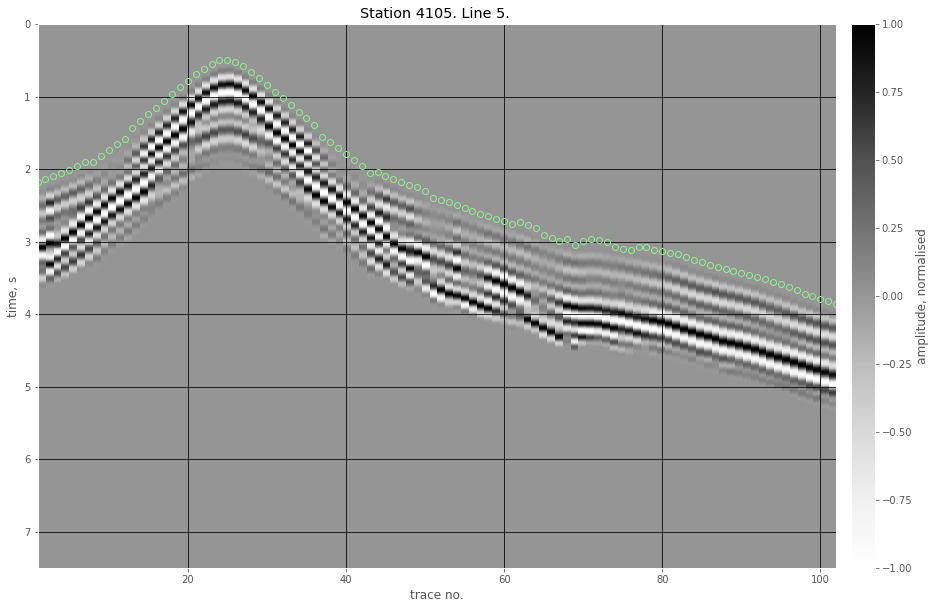

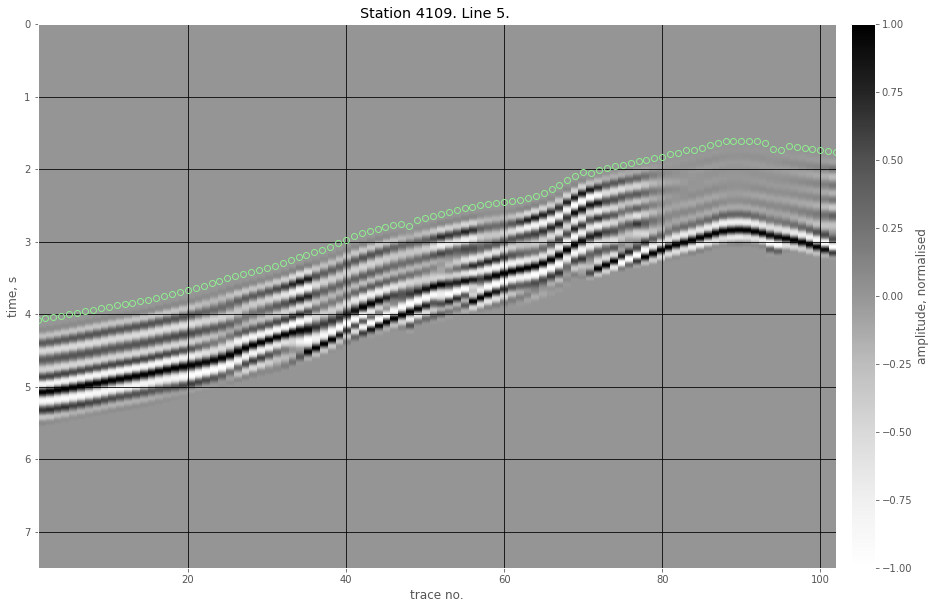

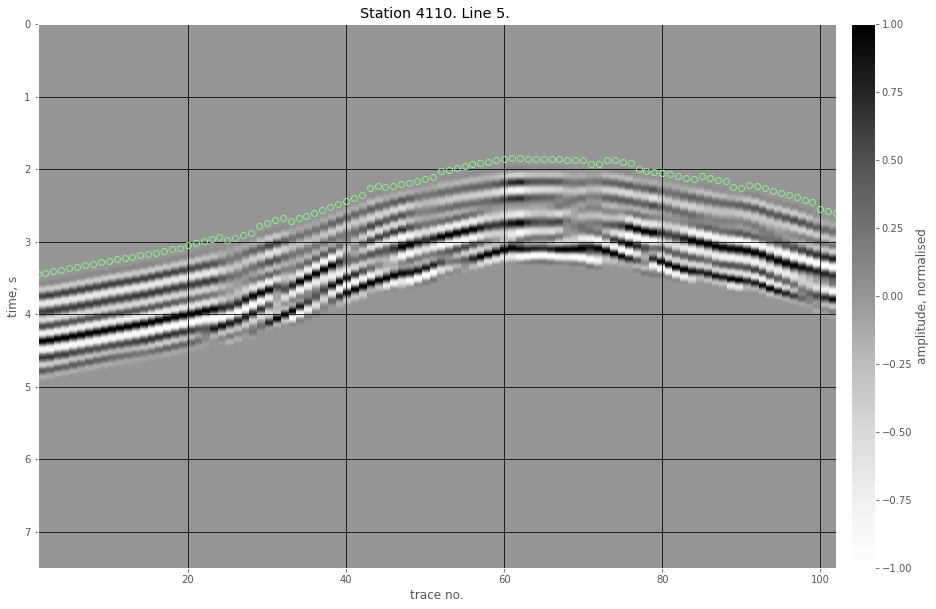

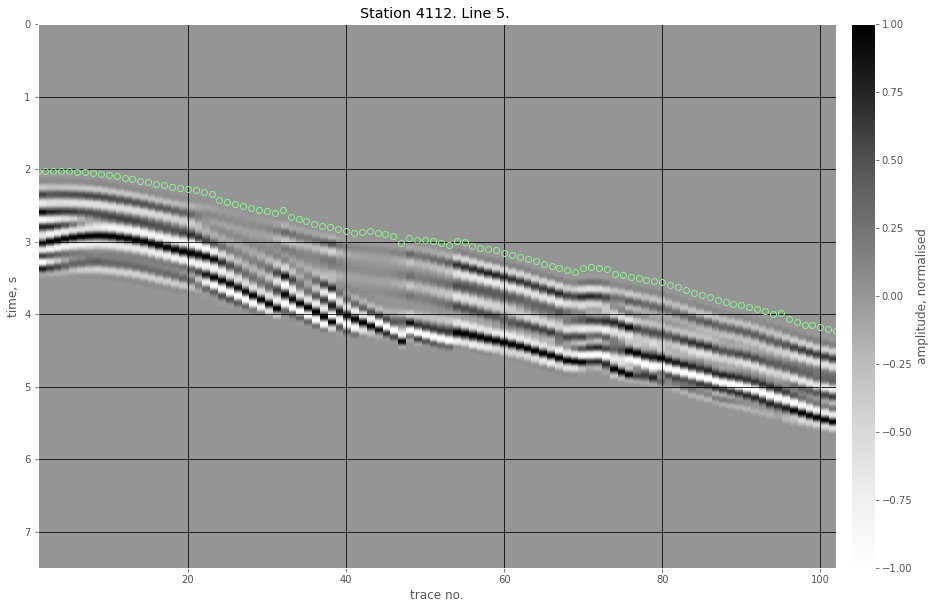

...

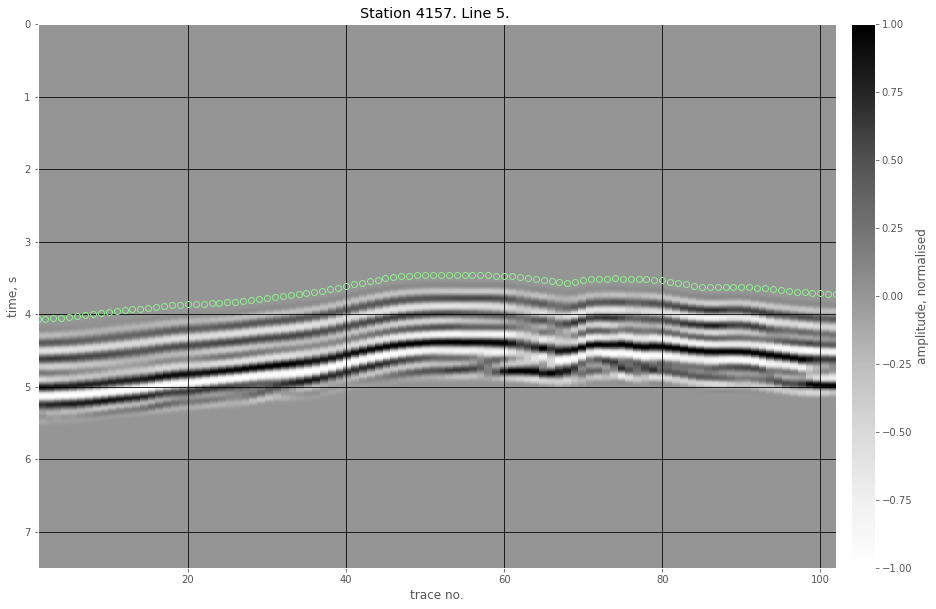

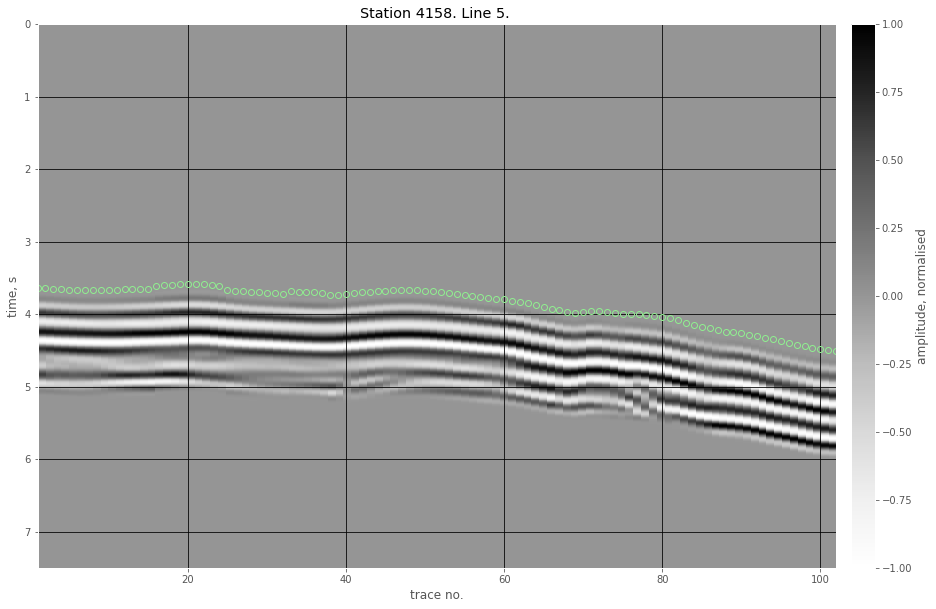

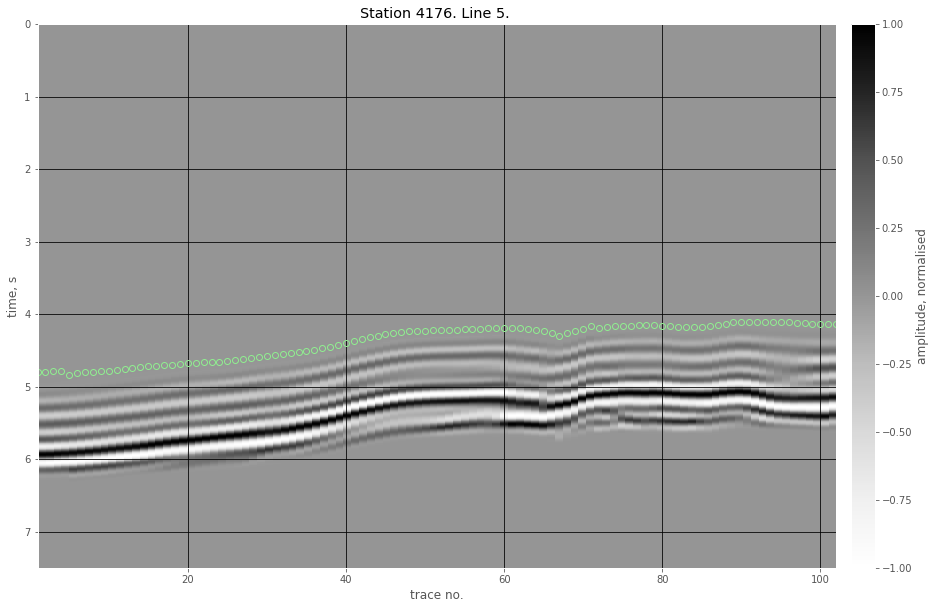

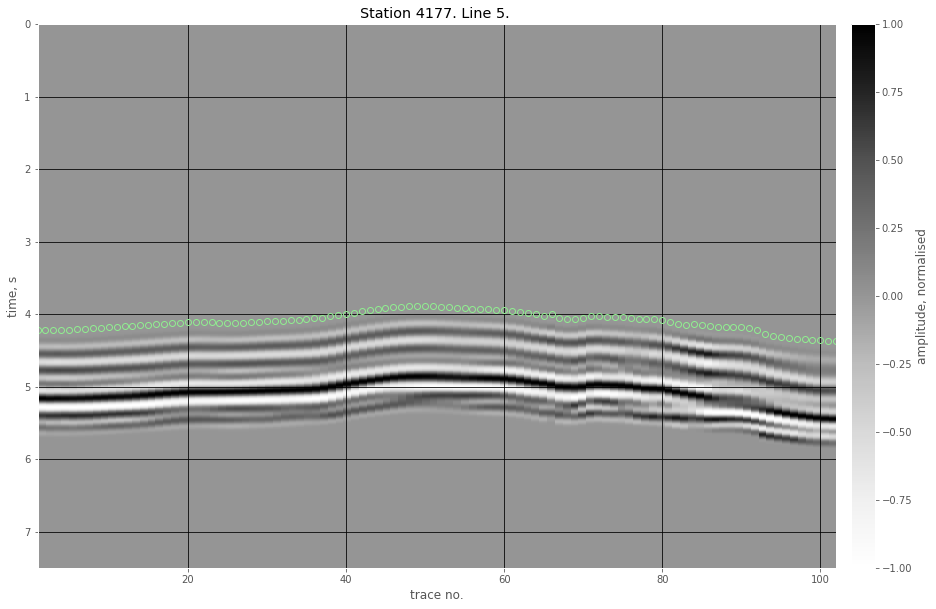

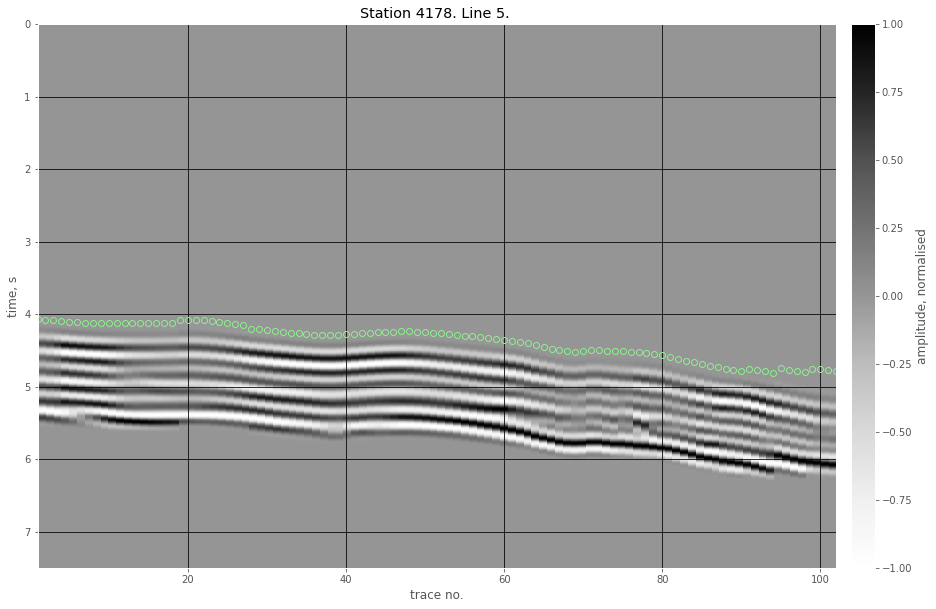

In [95]:
%%time 
lll(40)
stations = sorted(df.tracf.unique())
lines = sorted(df.ep.unique())
ov = 1
for station in stations:
    for line in lines:
        figure(15,10)
        synmut.plot(station=station, line=line, cmap='Greys', label='amplitude, normalised',
                 overwrite=ov, overwrite_mmp=ov)
        y = df.loc[(df.tracf==station) & (df.ep==line)]['fb']
        x = range(1, len(y)+1)
        plt.grid(color='k')
        _ = plt.plot(x, y, 'o', markeredgecolor='lightgreen', markerfacecolor='none')   
        break

# ...